# Google Earth Engine to Rasterio
<div style="display: flex; justify-content: space-around; align-items: center;">
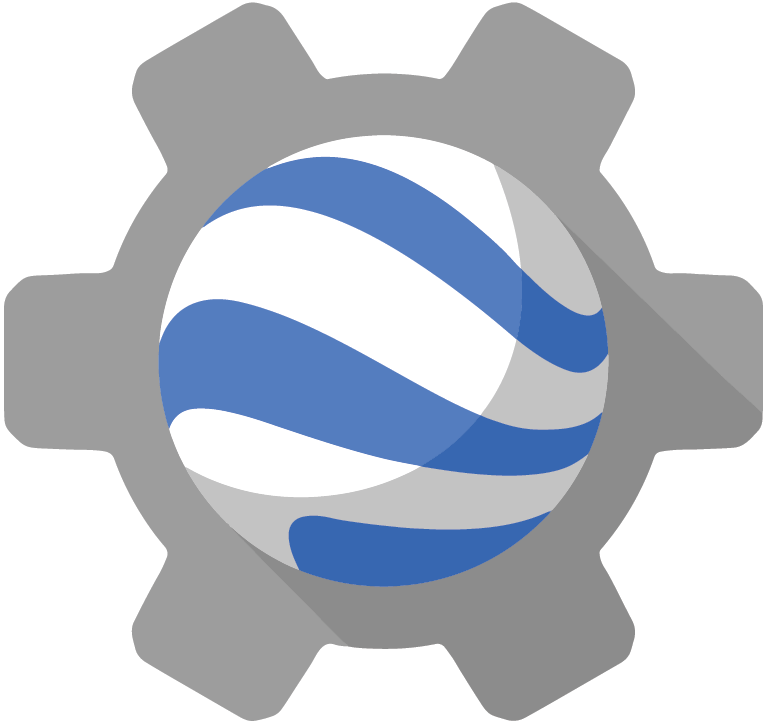
<span style="font-size: 50vh;">➡</span>
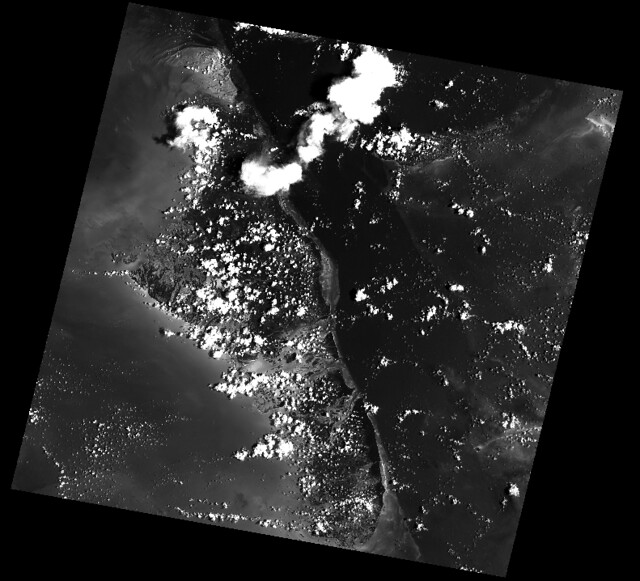
</div>


## Setting up the notebook's environment

### Python dependencies
I recommend running in a virtual environment / colab.

In [ ]:
%%bash
pip install jupyter_contrib_nbextensions
pip install RISE
pip install geemap
pip install eemont
pip install autopep8
pip install rasterio
pip install numpy
pip install blockdiagMagic

You should consider upgrading via the '/Users/admin/git/gee-to-rasterio/.venv/bin/python3 -m pip install --upgrade pip' command.


You should consider upgrading via the '/Users/admin/git/gee-to-rasterio/.venv/bin/python3 -m pip install --upgrade pip' command.


You should consider upgrading via the '/Users/admin/git/gee-to-rasterio/.venv/bin/python3 -m pip install --upgrade pip' command.


You should consider upgrading via the '/Users/admin/git/gee-to-rasterio/.venv/bin/python3 -m pip install --upgrade pip' command.


You should consider upgrading via the '/Users/admin/git/gee-to-rasterio/.venv/bin/python3 -m pip install --upgrade pip' command.


You should consider upgrading via the '/Users/admin/git/gee-to-rasterio/.venv/bin/python3 -m pip install --upgrade pip' command.


You should consider upgrading via the '/Users/admin/git/gee-to-rasterio/.venv/bin/python3 -m pip install --upgrade pip' command.


You should consider upgrading via the '/Users/admin/git/gee-to-rasterio/.venv/bin/python3 -m pip install --upgrade pip' command.


In [ ]:
import time

from IPython.display import IFrame

### How to view this notebook as a slide
Rerun jupyter notebook (via the web UI) after installing RISE, then you should see the following button, which opens the slideshow:
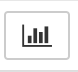

#### Preview
<video alt="Slides Preview" src="presentation-movie.mov" width="100%" autoplay controls />

#### More about slideshows in Jupyter

[How to generate a slideshow from a notebook](https://towardsdatascience.com/5-slides-for-tips-on-presentation-mode-in-jupyter-notebook-f858b15fff4f#:~:text=The%20first%20step%20is%20to,Slideshow%20option%20and%20continue%20reading.&text=Each%20cell%20in%20the%20Jupyter,in%20the%20upper%2Dright%20corner.)

[Adding Rise to be able to run slideshows from Jupyter](https://rise.readthedocs.io/en/stable/)

### In Code Diagrams
Diagrams should appear when Jupyter is run after the `blockdiagMagic` is installed.

#### More about the library
[Github repo](https://github.com/innovationOUtside/ipython_magic_blockdiag)

#### Example

In [ ]:
%load_ext blockdiag_magic

The blockdiag_magic extension is already loaded. To reload it, use:
  %reload_ext blockdiag_magic


In [ ]:
%setdiagsvg
#Reset to png output with: %setdiagpng


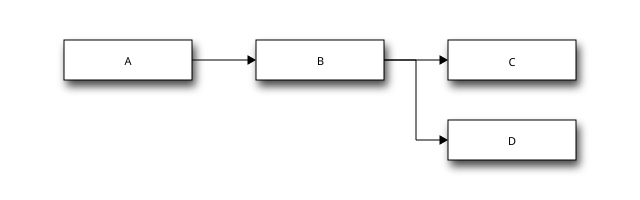

In [ ]:
%%blockdiag
A -> B -> C;
B -> D;


## Google Earth Engine
Google earth engine combines a multi-petabyte catalog of satellite imagery and geospatial datasets with planetary-scale analysis capabilities

In [ ]:
import ee, eemont, geemap
# Authenticate and Initialize Earth Engine and geemap.
ee.Authenticate()
ee.Initialize()

Enter verification code: 4/1AdQt8qhZUKsELWGrG_CMk9yUZLcojeMcU0kq9e35vArUkk2j4fdbeoWzXkY

Successfully saved authorization token.


In [ ]:
# Example point of interest to filter the image collection.
point = ee.Geometry.Point([-75.92, 2.86])
# Get and filter the Sentinel-2 Surface Reflectance image collection and filter it by region and time.
S2 = (ee.ImageCollection('COPERNICUS/S2_SR')
      .filterDate('2020-01-01','2021-01-01').filterBounds(point))
# Cloud Probability masking is the default method to mask clouds and shadows in Sentinel-2 (method = 'cloud_prob'). By default, the Cloud Probability threshold is 60% (prob = 60).
S2c = S2.maskClouds()

In [ ]:
# Visualization
# Set the visualization parameters.
rgbUnscaled = {'min':0, 'max':3000, 'bands':['B4','B3','B2']}
# Use geemap to display results.
Map = geemap.Map()
Map.centerObject(point,15)
Map.addLayer(S2c.median(),rgbUnscaled,'60% Cloud Probability masking')
Map

Map(center=[2.86, -75.92], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=HBox(childre…

In case of bad internet / viewing in a repo - here is what the map looks like
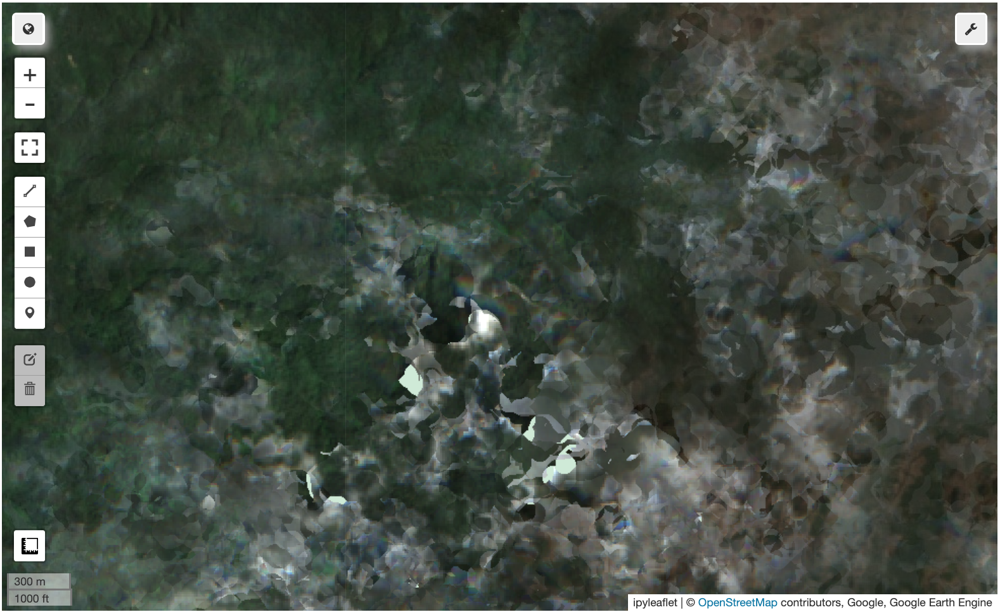

## Rasterio
Rasterio reads and writes geospatial raster data.

Geographic information systems use GeoTIFF and other formats to organize and store gridded, or raster, datasets. Rasterio reads and writes these formats and provides a Python API based on N-D arrays.

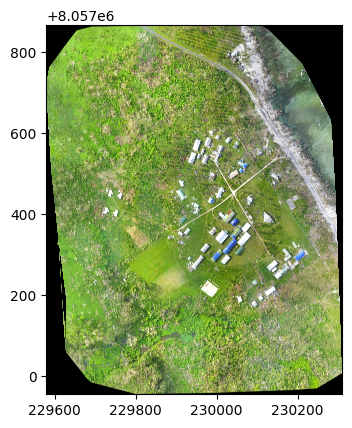

In [ ]:
import rasterio
from rasterio.plot import show

with rasterio.open("https://oin-hotosm.s3.amazonaws.com/56f9b5a963ebf4bc00074e70/0/56f9c2d42b67227a79b4faec.tif") as src:
    show(src)
    

In case of bad internet / viewing in a repo, here is what the output looks like:
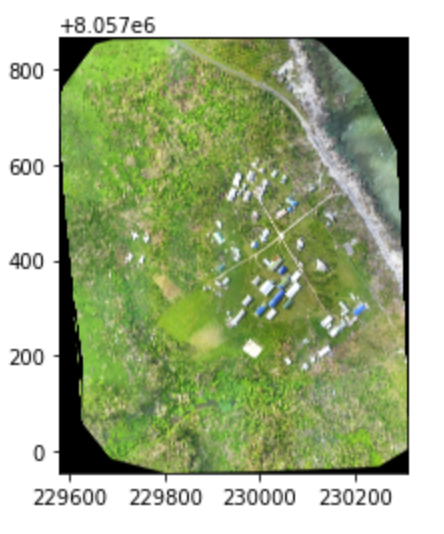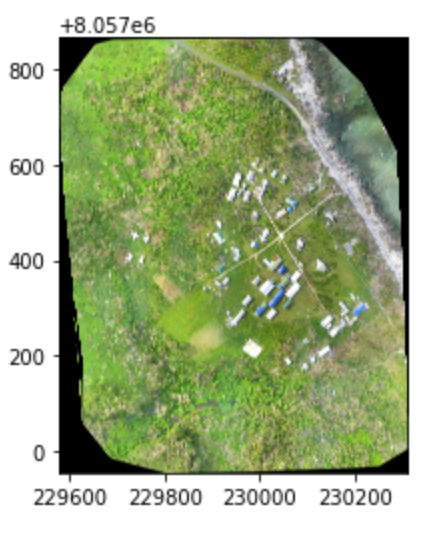

## High Level - Remote Sensing Pipeline
I'll be giving the hight level data flow with small demonstrate in code - with the goal of providing an easy starting point to fill the "pipeline" with steps relevant to individual projects.

In [ ]:
%setdiagsvg
#Reset to png output with: %setdiagpng
# Hide the input for the diagram after coding

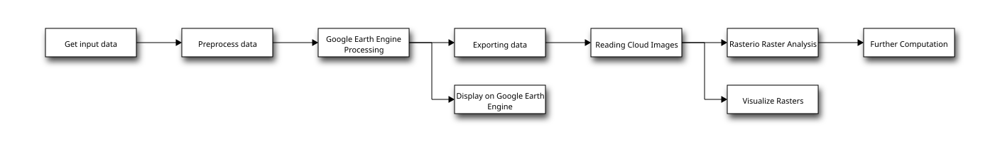

In [ ]:
%%blockdiag
"Get input data" -> "Preprocess data" -> """Google Earth Engine
Processing""" -> "Exporting data" -> "Reading Cloud Images" -> "Rasterio Raster Analysis" -> "Further Computation";
"""Google Earth Engine
Processing""" -> """Display on Google Earth Engine""";
"Reading Cloud Images" -> "Visualize Rasters";

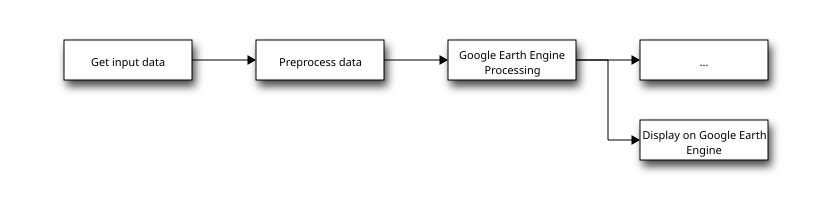

In [ ]:
%%blockdiag
"Get input data" -> "Preprocess data" -> """Google Earth Engine
Processing""" -> "..."
"""Google Earth Engine
Processing""" -> """Display on Google Earth Engine""";

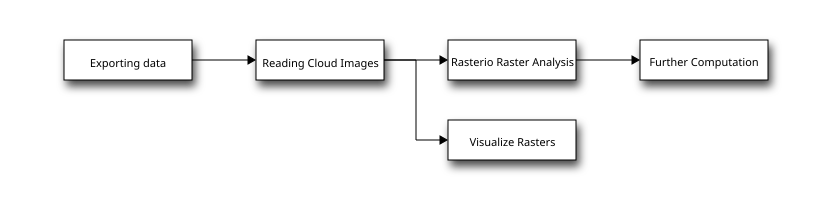

In [ ]:
%%blockdiag
"Exporting data" -> "Reading Cloud Images" -> "Rasterio Raster Analysis" -> "Further Computation";
"Reading Cloud Images" -> "Visualize Rasters";

### 1. Get input data

Google Earth Engine data catalog: https://developers.google.com/earth-engine/datasets

**Note: Some data can be accessed using other providers / using other services, some is unique**

#### Satellite Data
  - Sentinel (1, 2, 3) - 2 is used for current 10m res RGB, 1 for 10m res infrared
  - Landsat (4, 5, 7. 8. 9) - 8 is widely used for historical data at 30m res
  - High-Resolution Imagery
  - Others satellites: MODIS, ALOS

<div style="display: flex; justify-content: space-around; align-items: center;">
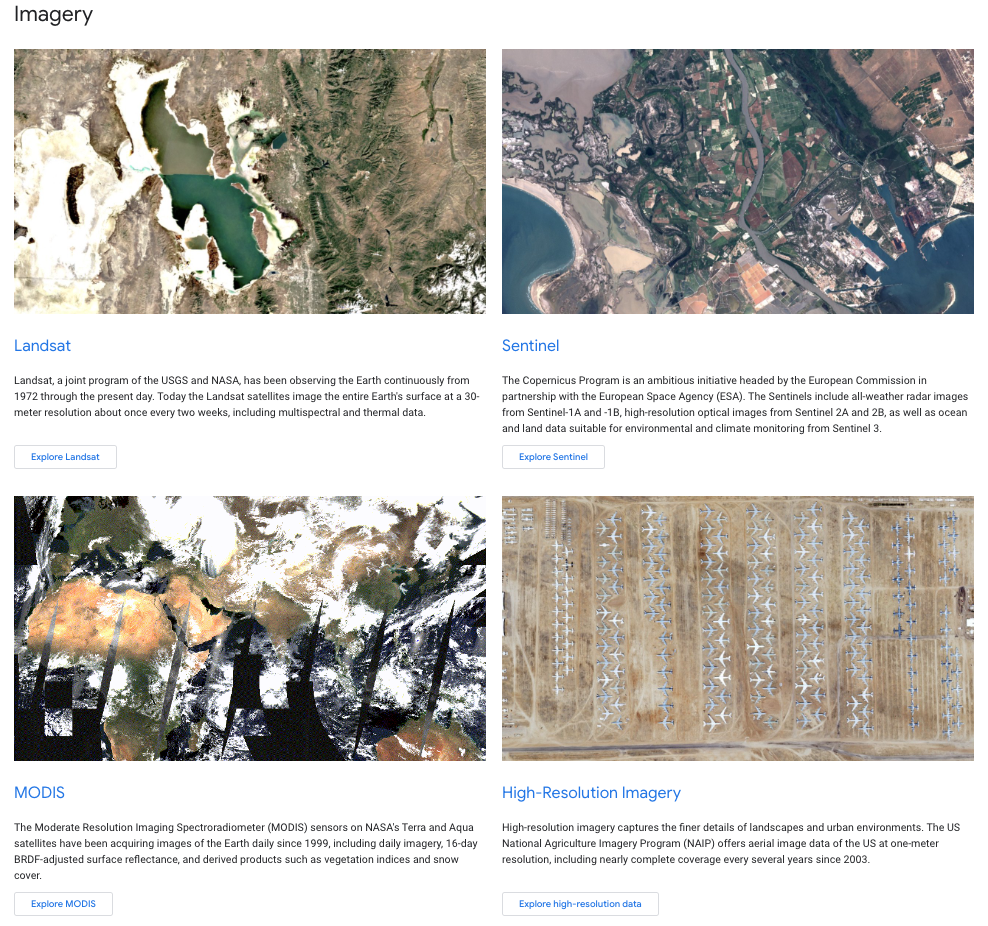
</div>

#### Precomputed data from previous analysis (manual or ML based)
  - Surface Temperature
  - Climate
  - Atmospheric
  - Weather
  - Elevation Data
  - Land Use / Land Cover (LULC)
  - More...

<div style="display: flex; justify-content: space-around; align-items: center;">
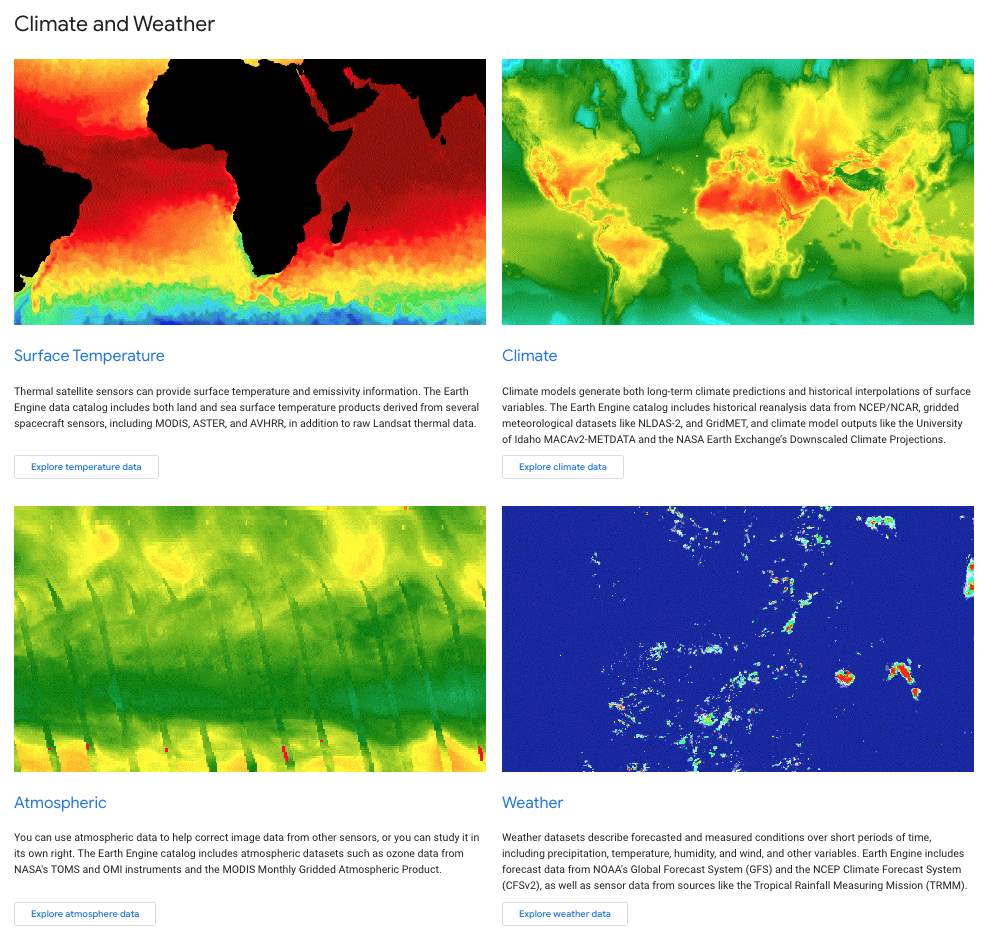
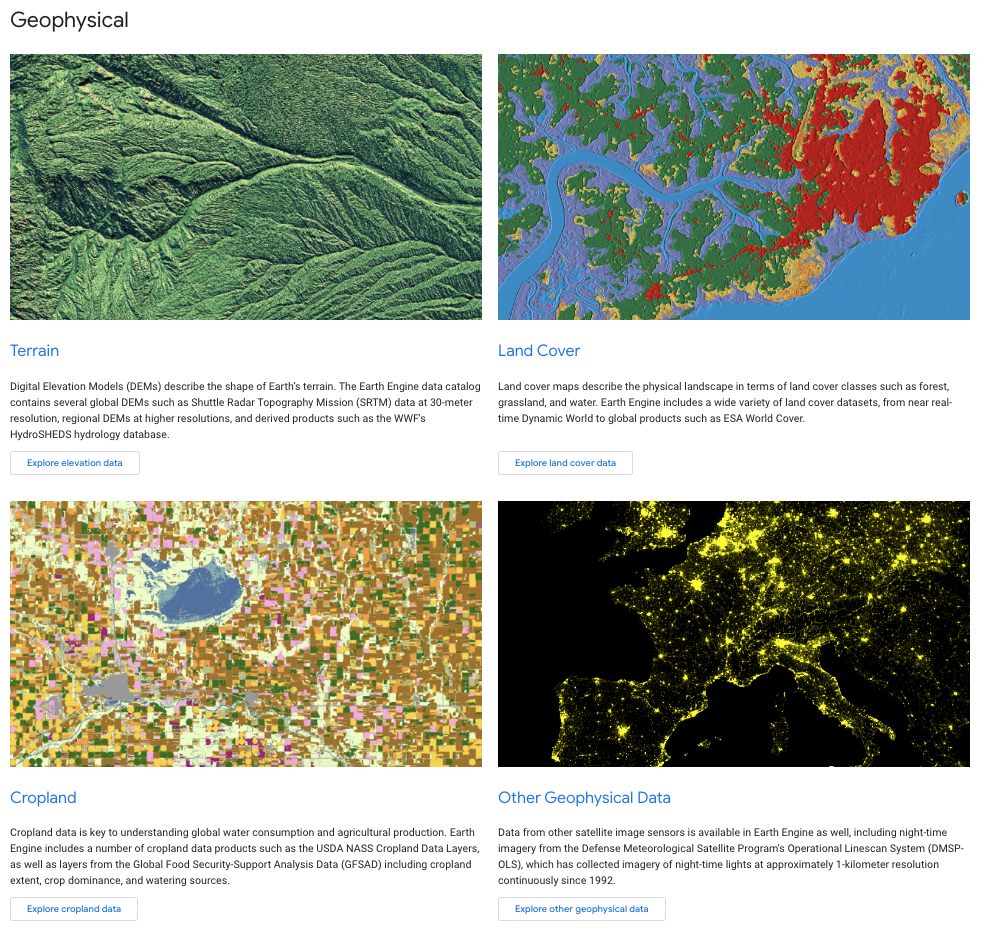
</div>

#### Area of interest (shape)
  - geopolitical border (country / state / city)
  - crop boundaries (precomputed or derived)
  - forest boundaries (precomputed or derived)

#### Uploaded Assets (images, shapes, tabular data)
  - via the [Google Earth Engine web interface](https://code.earthengine.google.com).
  

<div style="display: flex; justify-content: space-around; align-items: center;">
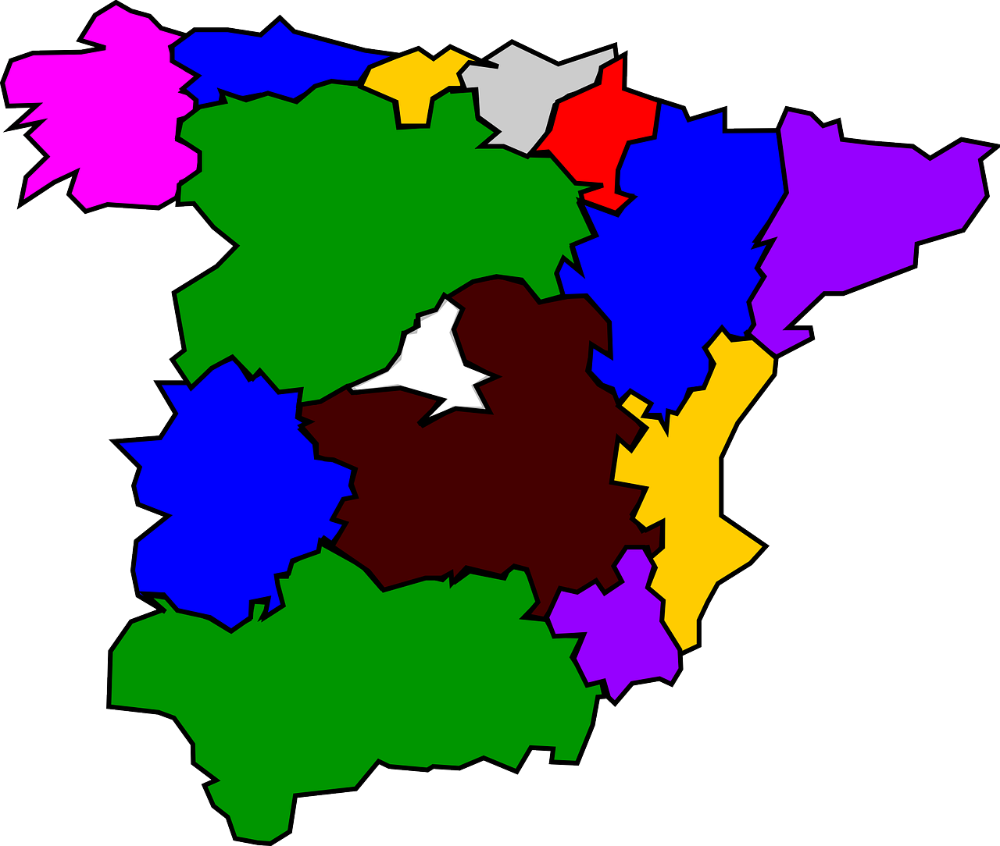
</div>

### 2. Preprocess input data
- Filter images by geographical bounds and time range
- Clip images by shape (different than filtering).
- Cloud removal
- Calculate spectral indices (research based measures for various ecological phenomena)
    - Technically part of processing, but many spectral indices are so common they are often used as input features for additional analysis
    - There are ready made libraries to calculate them: https://github.com/awesome-spectral-indices/spectral
- Calculate derived shapes if relevant

#### Javascript Libraries
I focus on Python APIs in this presentation as they allow us to work with one programming language accross the pipeline, though Google Earth Engine has a language agnostic (REST) API, and an online coding environment using JavaScript (albeit with a slightly limited syntax) as it's coding language, accessible via [code.earthengine.google.com](https://code.earthengine.google.com/).

If you come accross useful code written in JavaScript, conversion isn't too hard if you know both languages' syntax (main challenges are anonymous functions and dictionary parameters changing into keyword parameters in Python). Google provides some support for converting code from JavaScript to Python, demonstrated [in this notebook](https://github.com/giswqs/geemap/blob/master/examples/notebooks/15_convert_js_to_py.ipynb).

#### Example: S2 Preprocessing
Based on [this tutorial](https://developers.google.com/earth-engine/tutorials/community/sentinel-2-s2cloudless)

In [ ]:
AOI = ee.Geometry.Point([-75.92, 2.86]).buffer(100)
START_DATE = '2020-01-01'
END_DATE = '2021-01-01'
CLOUD_FILTER = 60
CLD_PRB_THRESH = 50
NIR_DRK_THRESH = 0.15
CLD_PRJ_DIST = 1
BUFFER = 50


def add_cloud_bands(img):
    # Get s2cloudless image, subset the probability band.
    cld_prb = ee.Image(img.get('s2cloudless')).select('probability')

    # Condition s2cloudless by the probability threshold value.
    is_cloud = cld_prb.gt(CLD_PRB_THRESH).rename('clouds')

    # Add the cloud probability layer and cloud mask as image bands.
    return img.addBands(ee.Image([cld_prb, is_cloud]))


def add_shadow_bands(img):
    # Identify water pixels from the SCL band.
    not_water = img.select('SCL').neq(6)

    # Identify dark NIR pixels that are not water (potential cloud shadow pixels).
    SR_BAND_SCALE = 1e4
    dark_pixels = img.select('B8').lt(
        NIR_DRK_THRESH*SR_BAND_SCALE).multiply(not_water).rename('dark_pixels')

    # Determine the direction to project cloud shadow from clouds (assumes UTM projection).
    shadow_azimuth = ee.Number(90).subtract(
        ee.Number(img.get('MEAN_SOLAR_AZIMUTH_ANGLE')))

    # Project shadows from clouds for the distance specified by the CLD_PRJ_DIST input.
    cld_proj = (img.select('clouds').directionalDistanceTransform(shadow_azimuth, CLD_PRJ_DIST*10)
                .reproject(**{'crs': img.select(0).projection(), 'scale': 100})
                .select('distance')
                .mask()
                .rename('cloud_transform'))

    # Identify the intersection of dark pixels with cloud shadow projection.
    shadows = cld_proj.multiply(dark_pixels).rename('shadows')

    # Add dark pixels, cloud projection, and identified shadows as image bands.
    return img.addBands(ee.Image([dark_pixels, cld_proj, shadows]))


def get_s2_sr_cld_col(aoi, start_date, end_date):
    # Import and filter S2 SR.
    s2_sr_col = (ee.ImageCollection('COPERNICUS/S2_SR')
                 .filterBounds(aoi)
                 .filterDate(start_date, end_date)
                 .filter(ee.Filter.lte('CLOUDY_PIXEL_PERCENTAGE', CLOUD_FILTER)))

    # Import and filter s2cloudless.
    s2_cloudless_col = (ee.ImageCollection('COPERNICUS/S2_CLOUD_PROBABILITY')
                        .filterBounds(aoi)
                        .filterDate(start_date, end_date))

    # Join the filtered s2cloudless collection to the SR collection by the 'system:index' property.
    return ee.ImageCollection(ee.Join.saveFirst('s2cloudless').apply(**{
        'primary': s2_sr_col,
        'secondary': s2_cloudless_col,
        'condition': ee.Filter.equals(**{
            'leftField': 'system:index',
            'rightField': 'system:index'
        })
    }))


def add_cld_shdw_mask(img):
    # Add cloud component bands.
    img_cloud = add_cloud_bands(img)

    # Add cloud shadow component bands.
    img_cloud_shadow = add_shadow_bands(img_cloud)

    # Combine cloud and shadow mask, set cloud and shadow as value 1, else 0.
    is_cld_shdw = img_cloud_shadow.select('clouds').add(
        img_cloud_shadow.select('shadows')).gt(0)

    # Remove small cloud-shadow patches and dilate remaining pixels by BUFFER input.
    # 20 m scale is for speed, and assumes clouds don't require 10 m precision.
    is_cld_shdw = (is_cld_shdw.focalMin(2).focalMax(BUFFER*2/20)
                   .reproject(**{'crs': img.select([0]).projection(), 'scale': 20})
                   .rename('cloudmask'))

    # Add the final cloud-shadow mask to the image.
    return img_cloud_shadow.addBands(is_cld_shdw)


def display_cloud_layers(col, Map):
    # Mosaic the image collection.
    img = col.mosaic()

    # Subset layers and prepare them for display.
    clouds = img.select('clouds').selfMask()
    shadows = img.select('shadows').selfMask()
    dark_pixels = img.select('dark_pixels').selfMask()
    probability = img.select('probability')
    cloudmask = img.select('cloudmask').selfMask()
    cloud_transform = img.select('cloud_transform')

    # Create a map object.
    Map.centerObject(AOI, 12)

    # Add layers to the Google Earth Engine map.
    Map.addLayer(img,
                 {'bands': ['B4', 'B3', 'B2'], 'min': 0,
                     'max': 2500, 'gamma': 1.1},
                 'S2 image', True, 1)
    Map.addLayer(probability,
                 {'min': 0, 'max': 100},
                 'probability (cloud)', True, 1)
    Map.addLayer(clouds,
                 {'palette': ['e056fd']},
                 'clouds', True, 1)
    Map.addLayer(cloud_transform,
                 {'min': 0, 'max': 1, 'palette': ['white', 'black']},
                 'cloud_transform', False, 1)
    Map.addLayer(dark_pixels,
                 {'palette': ['orange']},
                 'dark_pixels', True, 1)
    Map.addLayer(shadows, {'palette': ['yellow']},
                 'shadows', True, 1)
    Map.addLayer(cloudmask, {'palette': ['orange']},
                 'cloudmask', True, 0.5)


s2_sr_cld_col_eval = get_s2_sr_cld_col(AOI, START_DATE, END_DATE)

s2_sr_cld_col_eval_disp = s2_sr_cld_col_eval.map(add_cld_shdw_mask)

In [ ]:
Map = geemap.Map()
display_cloud_layers(s2_sr_cld_col_eval_disp, Map)
Map  # Display the map.

Map(center=[2.860000102548227, -75.91999999714189], controls=(WidgetControl(options=['position', 'transparent_…

In case of bad internet / viewing in a repo - here is what the map looks like
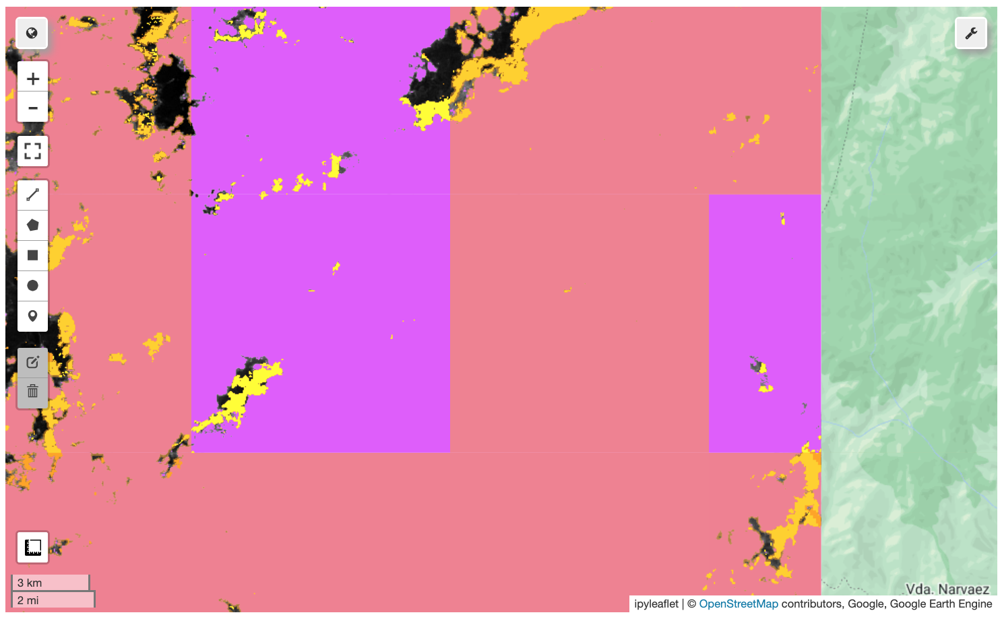

**Note: most preprocessing / spectral indices calculations can be easily performed using the eemont extension** (as seen in the first GEE Example)

Read more about these features in the [eemont library's documentation](https://eemont.readthedocs.io/en/latest/)

In [ ]:
IFrame('https://eemont.readthedocs.io/en/latest/#clouds-and-shadows-masking', width=900, height=500)

In case of bad internet / viewing in a repo - here is what the documentation looks like
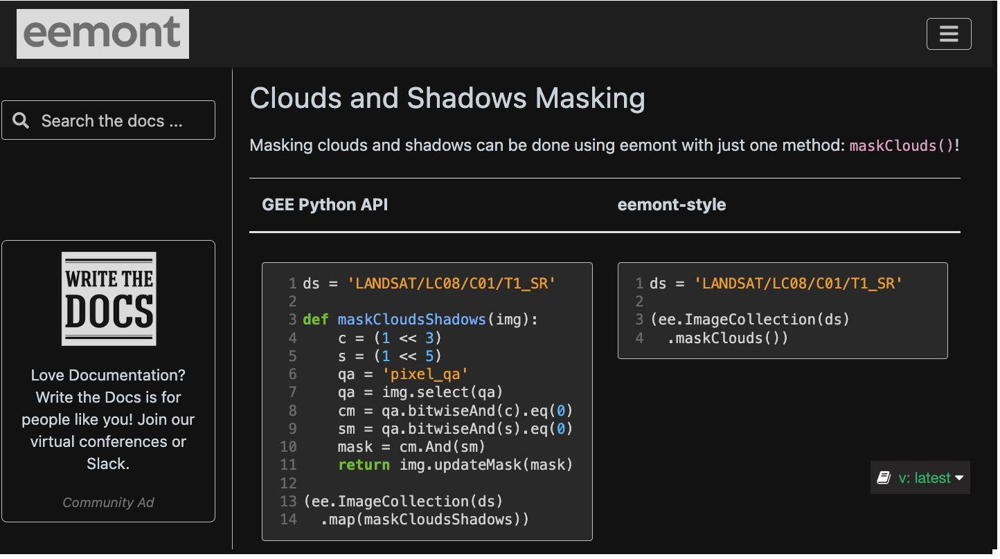

### 3. Processing on Google Cloud
Use Google Cloud via Google Earth Engine to run algorithms directly on large inputs (to save on data transfers and taking advantage of Google's Cloud).

- Provided Statistical / Machine learning models
- Timeseries analysis (i.e. [CCDC](https://developers.google.com/earth-engine/apidocs/ee-algorithms-temporalsegmentation-ccdc))
- Sampling the data (i.e. [by pixel](https://developers.google.com/earth-engine/apidocs/ee-image-sample))
- Reduction operations (i.e. [to value](https://developers.google.com/earth-engine/apidocs/ee-imagecollection-reduce)) 
- [Pixel based aggregations](https://developers.google.com/earth-engine/apidocs/ee-image-expression)
- Custom code running on a Google Cloud Platform (i.e. custom made Tensorflow models).

**Note - these operations are performed asynchronously on automatically assigned Google Cloud platforms. Their speed will depend on general usage and the size of the task. Some tasks might fail, requiring reducing the area of interest / amount of images analysed to complete**

#### Example: Supervised Classification
Based on [this tutorial](https://developers.google.com/earth-engine/guides/classification)

In [ ]:
LANDSAT_8 = ee.ImageCollection('LANDSAT/LC08/C02/T1_L2')

BIT_31 = '11111'
DEC_31 = int(BIT_31, 2)

# Define a function that scales and masks Landsat 8 surface reflectance images.


def prepSrL8(image):
    # Develop masks for unwanted pixels (fill, cloud, cloud shadow).
    # https://www.usgs.gov/media/images/landsat-collection-2-pixel-quality-assessment-bit-index
    # image.select - Returns an image with the selected bands
    qaMask = image.select('QA_PIXEL').bitwiseAnd(DEC_31).eq(0)
    # https://www.usgs.gov/landsat-missions/landsat-collection-2-quality-assessment-bands
    saturationMask = image.select('QA_RADSAT').eq(0)

    img_dict = image.toDictionary()

    # Apply the scaling factors to the appropriate bands.
    def getFactorImg(factorNames):
        factorList = img_dict.select(factorNames).values()
        return ee.Image.constant(factorList)

    # select accepts regular exceptions
    scaleImg = getFactorImg(
        ['REFLECTANCE_MULT_BAND_.|TEMPERATURE_MULT_BAND_ST_B10'])
    offsetImg = getFactorImg(
        ['REFLECTANCE_ADD_BAND_.|TEMPERATURE_ADD_BAND_ST_B10'])
    scaled = image.select('SR_B.|ST_B10').multiply(scaleImg).add(offsetImg)

    # Replace original bands with scaled bands and apply masks.
    # Image.addBands(srcImg, names, overwrite)
    return image \
        .addBands(scaled, None, True) \
        .updateMask(qaMask) \
        .updateMask(saturationMask)


first_start_date = '2021-03-01'
first_end_date = '2021-07-01'

first_date_images = LANDSAT_8.filterDate(first_start_date, first_end_date)

# Make a cloud-free Landsat 8 surface reflectance composite.
first_image = first_date_images.map(prepSrL8).median()

# Use these bands for prediction.
rgb_bands = ['SR_B4',  'SR_B3',  'SR_B2']
non_visual_wavelengths = ['SR_B5', 'SR_B6', 'SR_B7']
temp_bands = ['ST_B10']
wavelengths_with_temp_bands = rgb_bands + non_visual_wavelengths + temp_bands
# SR_B2		Band 2 (blue) surface reflectance
# SR_B3		Band 3 (green) surface reflectance
# SR_B4		Band 4 (red) surface reflectance
# SR_B5		Band 5 (near infrared) surface reflectance
# SR_B6		Band 6 (shortwave infrared 1) surface reflectance
# SR_B7		Band 7 (shortwave infrared 2) surface reflectance
# ST_B10	Band 10 surface temperature. If 'PROCESSING_LEVEL' is set to 'L2SR', this band is fully masked out.

first_prediction_bands = first_image.select(wavelengths_with_temp_bands)

# Load training points. The numeric property 'class' stores known labels.
points = ee.FeatureCollection('GOOGLE/EE/DEMOS/demo_landcover_labels')

# This property stores the land cover labels as consecutive integers starting from zero.
landcover_label = 'landcover'

# Overlay the points on the imagery to get training.
first_training = first_prediction_bands.sampleRegions(**{
    'collection': points,
    'properties': [landcover_label],
    'scale': 30
})

# Train a CART classifier with default parameters.
first_trained = ee.Classifier.smileCart().train(
    first_training, landcover_label, wavelengths_with_temp_bands)

# Classify the image with the same bands used for training.
first_classified = first_image.select(
    wavelengths_with_temp_bands).classify(first_trained)

ClassificationMap = geemap.Map()

# Display the inputs and the results.
ClassificationMap.setCenter(-122.0877, 37.7880, 11)
ClassificationMap.addLayer(first_image,
                           {'bands': rgb_bands, 'min': 0, 'max': 0.25},
                           'sat-image')
ClassificationMap.addLayer(first_classified,
                           {'min': 0, 'max': 2, 'palette': [
                               'orange', 'green', 'blue']},
                           'classification')

In [ ]:
ClassificationMap

Map(center=[37.788, -122.0877], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=HBox(ch…

In case of bad internet / viewing in a repo - here is what the map looks like
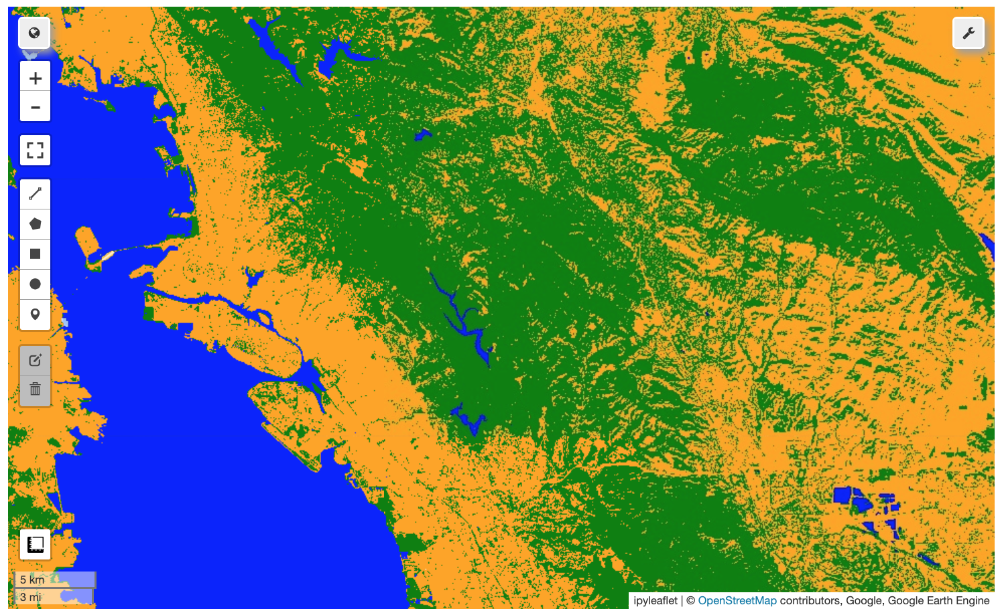

### Ending A: Display data on Google Earth Engine
In some cases, keeping our code and data on Google Earth Engine is enough, as the platform provides us with the ability to:
- generate interactive maps with embedded layers and data - displayed in notebooks or using the JavaScript API
- code apps running wholely on the Google Earth Engine plaform - only using the JavaScript API (i.e. [CCDC Tools](https://parevalo_bu.users.earthengine.app/view/visualize-ccdc), [Dynamic World](https://dynamicworld.app/explore))

In [ ]:
IFrame('https://parevalo_bu.users.earthengine.app/view/visualize-ccdc', width=900, height=250)

In [ ]:
IFrame('https://dynamicworld.app/explore', width=900, height=350)

In case of bad internet / viewing in a repo - here is what the apps looks like
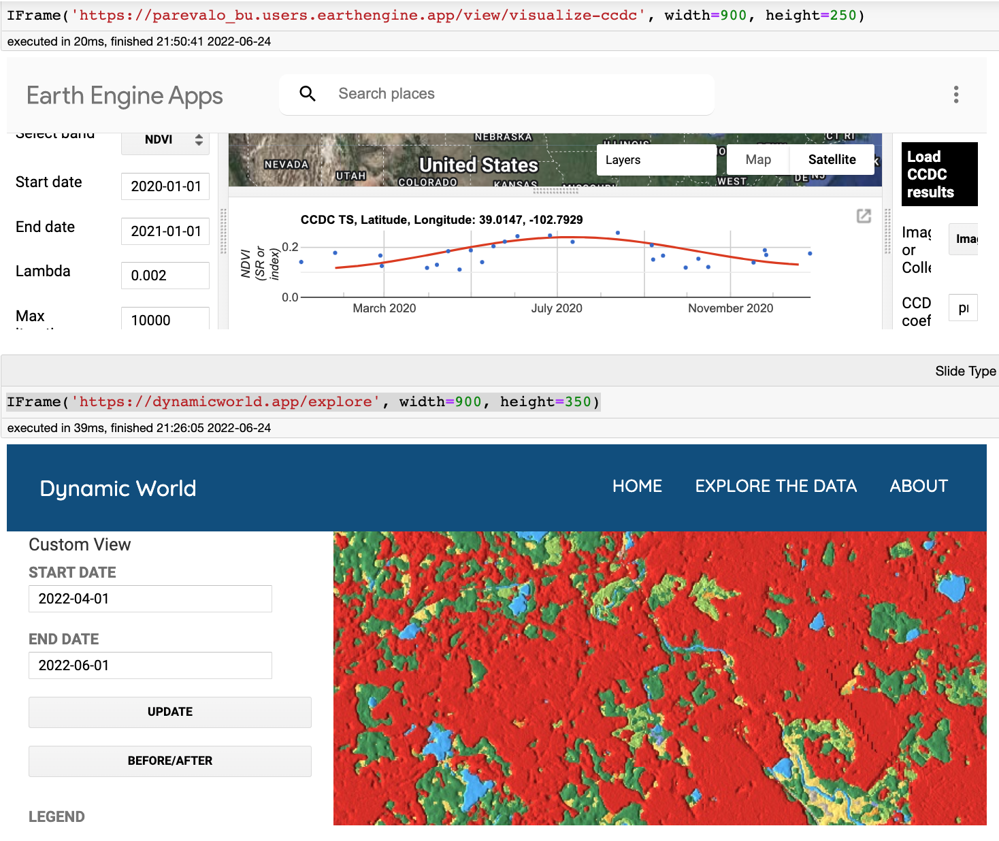

#### Advantages:
- Less code to handle
- Google provided basemap
- No additional costs for hosting / map access

#### Disadvantages:
- Vendor lock-in
- Limited access to data outside the platform (mainly by uploading to GCS / Google Earth Engine directly)
- Requires using Google Cloud and learning Google Earth Engine APIs to run custom code
- UI is limited to Google Earth Engine APIs
- Licensing limitations due to code running on Google Platform

### 4. Exporting data
Google Earth Engine provides library support to export the following:
- Tables - data in columns and rows, i.e. CSV data
- Images - 3D arrays of data (multiband images) with various data types and additional metadata - i.e. GeoTiff data
- Maps - a rectangular pyramid of map tiles for use with web map viewers (images at different zoom levels).

Data can be exported to
- Google Earth Engine as assets
- Google Drive as files
- Google Cloud Storage as files on "bucket" storage (storage with no predefined size limit and apis used for ease in streaming the data).
  * Note: GeoTIFS in Google Cloud Storage can be read directly using the `ee.Image.loadGeoTIFF` static method ([docs](https://developers.google.com/earth-engine/apidocs/ee-image-loadgeotiff)).

#### Example: Code to Handle Exports
Based on [this tutorial](https://colab.research.google.com/github/csaybar/EEwPython/blob/master/10_Export.ipynb)

In [ ]:
one_hour_in_secs = 60 * 60


def task_status(task_id):
    """Fetches the current status of the task.

    Returns:
      A dictionary describing the current status of the task as it appears on
      the EE server. Includes the following fields:
      - state: One of the values in Task.State.
      - creation_timestamp_ms: The Unix timestamp of when the task was created.
      - update_timestamp_ms: The Unix timestamp of when the task last changed.
      - output_url: URL of the output. Appears only if state is COMPLETED.
      - error_message: Failure reason. Appears only if state is FAILED.
      May also include other fields.
    """
    result = ee.data.getTaskStatus(task_id)[0]

    if result['state'] == 'UNKNOWN':
        result['state'] = ee.batch.Task.State.UNSUBMITTED

    return result


def is_task_active(task_id):
    """Returns whether the task is still running."""
    return task_status(task_id)['state'] in (ee.batch.Task.State.READY,
                                             ee.batch.Task.State.RUNNING,
                                             ee.batch.Task.State.CANCEL_REQUESTED)


def wait_for_task_to_finish(task, end_msg=""):
    while task.active():
        print('Polling for task (id: {}).'.format(task.id))
        time.sleep(5)

    status = task.status()
    print(status)
    if (status['state'] != 'FAILED'):
        if end_msg:
            print(end_msg)
        return True, status
    else:
        return False, status


def wait_for_task_id_to_finish(task_id, end_msg=""):
    while is_task_active(task_id):
        print('Polling for task (id: {}).'.format(task_id))
        time.sleep(5)

    status = task_status(task_id)
    print(status)
    if (status['state'] != 'FAILED'):
        if end_msg:
            print(end_msg)
        return True, status
    else:
        print(f"Completed with status '{status}'")
        return False, status


def run_export_func_sync(export_func, table_output, output_filename, output_bucket):
    task = export_func(table_output, output_filename, output_bucket)
    task.start()
    wait_for_task_to_finish(
        task, f'Task {task.id} is done, saved to {output_filename}')


In [ ]:
def generate_export_image_to_storage_task(img_output, output_filename, output_bucket):
    image, region = img_output
    # Export a GeoTIF file to Cloud Storage.

    return ee.batch.Export.image.toCloudStorage(**{
        'image': image,
        'region':region,
        'crs': 'EPSG:4326',
        'scale': 10,
        'maxPixels':1e13,
        'bucket': output_bucket,
        'fileNamePrefix': output_filename,
    })

def generate_export_table_to_storage_task(table_output, output_filename, output_bucket):
    # Export a CSV file to Cloud Storage.
    return ee.batch.Export.table.toCloudStorage(
        collection=table_output,
        bucket=output_bucket,
        fileNamePrefix=output_filename,
    )


### 5. Reading Cloud Images

#### Access Locally
Copy images locally before processing (in case of a need for faster code access to the image, i.e. multiple reads of the whole image for analysis / usage in an ML model).
<div style="display: flex; justify-content: space-around; align-items: center;">
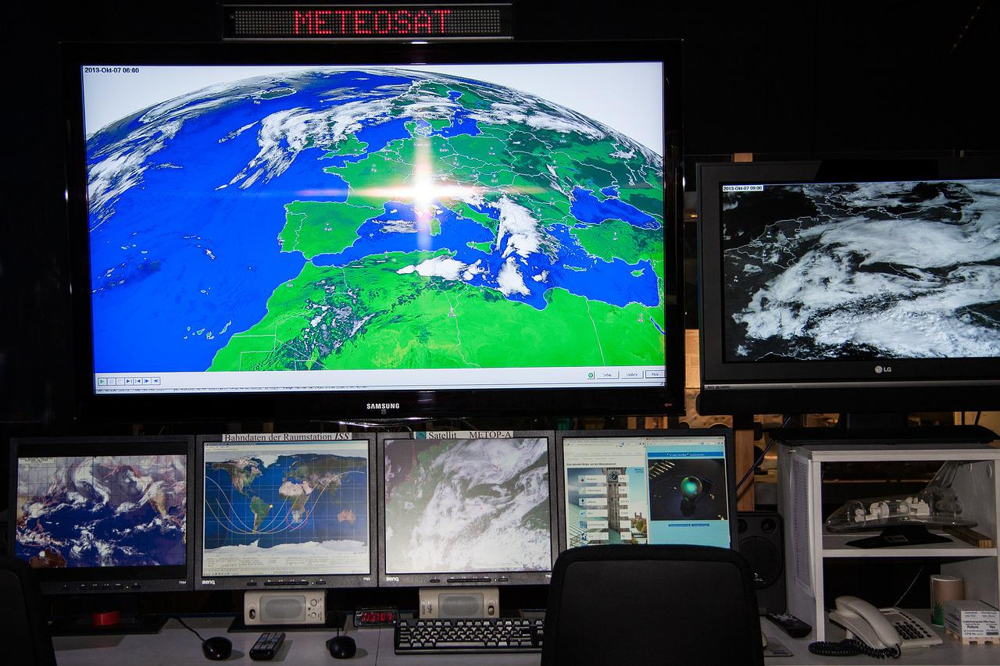
</div>

```python
with rasterio.open('data/RGB.byte.tif') as dataset:
    print(dataset.profile)
```

#### Access Remotely
Access images remotely via cloud (in case of less frequent read access / need for infrastructure flexibility, i.e a conversion pipeline or displaying the map - assuming data is saved in a "streamable" format - AKA [Cloud Optimized GeoTiffs](http://www.cogeo.org/)).

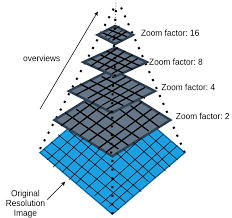
[Image Source - planet.com](https://developers.planet.com/docs/planetschool/an-introduction-to-cloud-optimized-geotiffs-cogs-part-1-overview/)

```python
with rasterio.open("https://oin-hotosm.s3.amazonaws.com/56f9b5a963ebf4bc00074e70/0/56f9c2d42b67227a79b4faec.tif") as src:
    show(src)
```

#### GDAL and Virtual File Systems
This flexibility in access is possible by using the Geospatial Data Abstraction Library - the de-facto standard for reading / writing raster data, and it's support for [virtual file systems](https://gdal.org/user/virtual_file_systems.html). It also supports reading archived data.
<div>
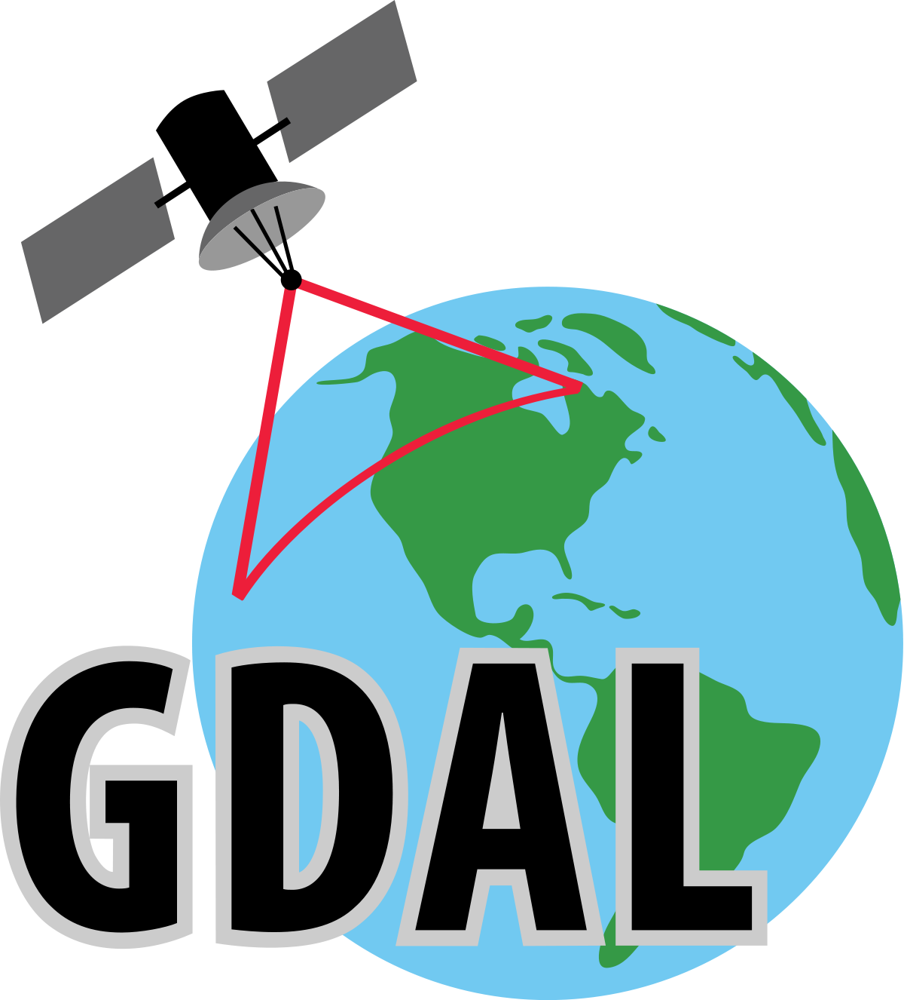
</div>

#### Additional read methods
Some more read / write methods are demonstrated in [this gist](https://gist.github.com/VehpuS/093904764cceb978b0ced9ebdae7d213).

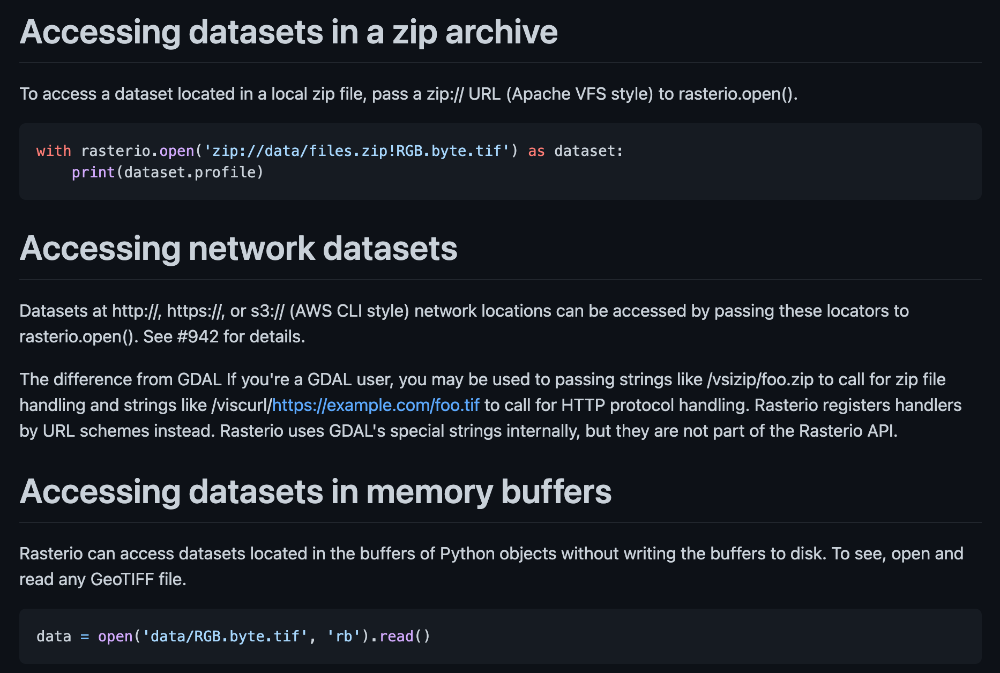

### Ending B: Visualize Rasters

#### Serve COGs using GeoServer

http://geoserver.org/
https://github.com/geoserver/geoserver

GeoServer is an open source server for sharing geospatial data. Designed for interoperability, it
publishes data from any major spatial data source using open standards, including COGs:

https://docs.geoserver.org/latest/en/user/community/cog/cog.html?highlight=geotiff

#### Serve COGs using MapTiler

https://www.maptiler.com/server/

https://documentation.maptiler.com/hc/en-us/articles/4404732284305-Imagery-Hosting-
GeoTIFF-
MapTiler Server is software for self-hosting data produced by the MapTiler platform. Among other

things, it can convert Shapefiles or raster images for super fast map loading, and serve pre-
generated map tiles in GeoPackage or MBTiles format.

#### Custom Built Servers

Libraries that use GDAL as a low level layer for reading GeoTIFFs support streaming raster data from bucket
storage and other remote sources, including various libraries used to create tile servers from GeoTIFFs.

Many of the supported libraries are listed on the COG website: https://www.cogeo.org.

For a easy to use Python based server, I recommend [Terracotta](https://terracotta-python.readthedocs.io/en/latest/get-started.html).

### 5. Using Rasterio for Raster Analysis

In [ ]:
import rasterio
# Open a geospatial dataset
dataset = rasterio.open("https://oin-hotosm.s3.amazonaws.com/56f9b5a963ebf4bc00074e70/0/56f9c2d42b67227a79b4faec.tif")
print(dataset)

<open DatasetReader name='https://oin-hotosm.s3.amazonaws.com/56f9b5a963ebf4bc00074e70/0/56f9c2d42b67227a79b4faec.tif' mode='r'>


In [ ]:
# what is the name of this image
img_name = dataset.name
print('Image filename: {n}\n'.format(n=img_name))

# How many bands does this image have?
num_bands = dataset.count
print('Number of bands in image: {n}\n'.format(n=num_bands))

# How many rows and columns?
rows, cols = dataset.shape
print('Image size is: {r} rows x {c} columns\n'.format(r=rows, c=cols))

Image filename: https://oin-hotosm.s3.amazonaws.com/56f9b5a963ebf4bc00074e70/0/56f9c2d42b67227a79b4faec.tif

Number of bands in image: 3

Image size is: 25201 rows x 20179 columns



In [ ]:
# Does the raster have a description or metadata?
desc = dataset.descriptions
metadata = dataset.meta

print('Raster description: {desc}\n'.format(desc=desc))

# What driver was used to open the raster?
driver = dataset.driver
print('Raster driver: {d}\n'.format(d=driver))

# What is the raster's projection?
proj = dataset.crs
print('Image projection:')
print(proj)

Raster description: (None, None, None)

Raster driver: GTiff

Image projection:
EPSG:32759


In [ ]:
# What is the raster's "geo-transform"
gt = dataset.transform

print('Image geo-transform:\n{gt}\n'.format(gt=gt))

print('All raster metadata:')
print(metadata)

Image geo-transform:
| 0.04, 0.00, 229579.08|
| 0.00,-0.04, 8057866.86|
| 0.00, 0.00, 1.00|

All raster metadata:
{'driver': 'GTiff', 'dtype': 'uint8', 'nodata': None, 'width': 20179, 'height': 25201, 'count': 3, 'crs': CRS.from_epsg(32759), 'transform': Affine(0.0362, 0.0, 229579.08329,
       0.0, -0.0362, 8057866.857120001)}


The rasterio Dataset object we created contains a lot of useful information but it is not directly used to read in the raster image. Instead we will need to access the raster's bands using the read() method:

In [ ]:
# A window is a view onto a rectangular subset of a raster dataset and is described in rasterio by
# column and row offsets and width and height in pixels. These may be ints or floats.
from rasterio.windows import Window
row_start = 0
row_stop = 1000
col_start = 0
col_stop = 1000
window = Window.from_slices((row_start, row_stop), (col_start, col_stop))

# Open the second band in our image
data = dataset.read(window=window)
data.shape # check out the dimensions of the image

(3, 1000, 1000)

In [ ]:
import numpy as np

# What are the image's datatypes?
datatype = dataset.dtypes
print('Band datatypes: {dt}'.format(dt=datatype))

# How about some image statistics?
image_mean = np.mean(data)
image_min = np.amin(data)
image_max = np.amax(data)
image_stddev = np.std(data)
print('Image range: {minimum} - {maximum}'.format(maximum=image_max,
                                                 minimum=image_min))
print('Image mean, stddev: {m}, {s}\n'.format(m=image_mean, s=image_stddev))

Band datatypes: ('uint8', 'uint8', 'uint8')
Image range: 0 - 0
Image mean, stddev: 0.0, 0.0



### Ending C: Use Raster Data as Input for Further Computation
As you can see, reading rasterio data generates numpy arrays that can be processed in any Data Analysis / Machine Learning ecosystem. There is no "right" way to proceed - so either use libraries you have experience, or start from tutorials, such as:

- https://www.drivendata.co/blog/cloud-cover-benchmark/
- https://colab.research.google.com/github/ishgirwan/omdena_hdi/blob/master/training_model.ipynb#scrollTo=gsgOsjXXwWhp

## Resources / Tutorials
- [GeeMap Library Documentation](https://geemap.org/usage/)
- [Ee-mont User Guide](https://eemont.readthedocs.io/en/latest/guide/index.html)
- [End-to-end GEE](https://courses.spatialthoughts.com/end-to-end-gee.html)
- [OpenGeo Tutorial](https://github.com/patrickcgray/open-geo-tutorial)
- [Public GEE Repositories](https://earthengine.googlesource.com/)